In [1]:
import pandas as pd
import numpy as np
import pandas_profiling
import matplotlib
from matplotlib import pyplot
import seaborn as sns

df = pd.read_csv('G:/New_Directory/Python/Class14/datasets/LoansData.csv')

In [2]:
df.head(3)

,LoanID,Amount.Requested,Amount.Funded.By.Investors,Interest.Rate,Loan.Length,Loan.Purpose,Debt.To.Income.Ratio,State,Home.Ownership,Monthly.Income,FICO.Range,Open.CREDIT.Lines,Revolving.CREDIT.Balance,Inquiries.in.the.Last.6.Months,Employment.Length
0,1,20000.0,20000.0,8.90%,36 months,debt_consolidation,14.90%,SC,MORTGAGE,6541.67,735-739,14.0,14272.0,2.0,< 1 year
1,2,19200.0,19200.0,12.12%,36 months,debt_consolidation,28.36%,TX,MORTGAGE,4583.33,715-719,12.0,11140.0,1.0,2 years
2,3,35000.0,35000.0,21.98%,60 months,debt_consolidation,23.81%,CA,MORTGAGE,11500.00,690-694,14.0,21977.0,1.0,2 years


In [3]:
df.tail(3)

,LoanID,Amount.Requested,Amount.Funded.By.Investors,Interest.Rate,Loan.Length,Loan.Purpose,Debt.To.Income.Ratio,State,Home.Ownership,Monthly.Income,FICO.Range,Open.CREDIT.Lines,Revolving.CREDIT.Balance,Inquiries.in.the.Last.6.Months,Employment.Length
2497,2498,10000.0,10000.00,13.99%,36 months,debt_consolidation,4.89%,PA,MORTGAGE,2166.67,680-684,4.0,4544.0,0.0,10+ years
2498,2499,6000.0,6000.00,12.42%,36 months,major_purchase,16.66%,NJ,RENT,3500.00,675-679,8.0,7753.0,0.0,5 years
2499,2500,9000.0,5242.75,13.79%,36 months,debt_consolidation,6.76%,NY,RENT,3875.00,670-674,7.0,7589.0,0.0,10+ years


In [4]:
df.duplicated().sum()

0

In [5]:
df.dtypes

LoanID                              int64
Amount.Requested                  float64
Amount.Funded.By.Investors        float64
Interest.Rate                      object
Loan.Length                        object
Loan.Purpose                       object
Debt.To.Income.Ratio               object
State                              object
Home.Ownership                     object
Monthly.Income                    float64
FICO.Range                         object
Open.CREDIT.Lines                 float64
Revolving.CREDIT.Balance          float64
Inquiries.in.the.Last.6.Months    float64
Employment.Length                  object
dtype: object

In [6]:
df.shape

(2500, 15)

In [7]:
df.describe()

,LoanID,Amount.Requested,Amount.Funded.By.Investors,Monthly.Income,Open.CREDIT.Lines,Revolving.CREDIT.Balance,Inquiries.in.the.Last.6.Months
count,2500.00000,2499.000000,2499.000000,2499.000000,2497.000000,2497.000000,2497.000000
mean,1250.50000,12405.462185,12002.374186,5688.931321,10.072887,15223.184622,0.906688
std,721.83216,7802.933666,7746.767348,3963.118185,4.507416,18281.015258,1.231149
min,1.00000,1000.000000,-0.010000,588.500000,2.000000,0.000000,0.000000
25%,625.75000,6000.000000,6000.000000,3500.000000,7.000000,5584.000000,0.000000
50%,1250.50000,10000.000000,10000.000000,5000.000000,9.000000,10948.000000,0.000000
75%,1875.25000,17000.000000,16000.000000,6800.000000,13.000000,18861.000000,1.000000
max,2500.00000,35000.000000,35000.000000,102750.000000,38.000000,270800.000000,9.000000


In [8]:
df.count()[df.count()<2500]

Amount.Requested                  2499
Amount.Funded.By.Investors        2499
Interest.Rate                     2498
Debt.To.Income.Ratio              2499
Home.Ownership                    2499
Monthly.Income                    2499
FICO.Range                        2498
Open.CREDIT.Lines                 2497
Revolving.CREDIT.Balance          2497
Inquiries.in.the.Last.6.Months    2497
Employment.Length                 2423
dtype: int64

**To import pandas profiling**

- go to anaconda prompt and write: pip install pandas_profiling   /  conda install pandas_profiling
- In the jupyter notebook type in a code cell: ! pip install pip pandas_profiling

In [155]:
my_report = pandas_profiling.ProfileReport(df)

In [184]:
my_report

**Problems Identified**
- Columns names are not as per python naming rules
- There are columns with wrong data type
- There are variables with missing value
- There are no special characters
- There are no duplicates
- There are no var with very less variance

# Modeling

### Selection of the Algorithm
- We are selecting linear regression as we want to know how the variables impact the Y variable

### Data Preparation Level 1

###### Making column names as per python naming rules

In [12]:
df.columns = df.columns.str.replace(".","_")

###### Changing the data types in proper order

In [13]:
df.Interest_Rate = df.Interest_Rate.str.replace("%","").astype('float64')

In [14]:
df.Loan_Length = df.Loan_Length.str.replace(" months","").astype("int64")

In [15]:
df.Debt_To_Income_Ratio = df.Debt_To_Income_Ratio.str.replace("%","").astype("float64")

In [16]:
df.Employment_Length = df.Employment_Length.str.replace("< ","")
df.Employment_Length = df.Employment_Length.str.replace("years","")
df.Employment_Length = df.Employment_Length.str.replace(" year","")
df.Employment_Length = df.Employment_Length.str.replace(" ","") 
df.Employment_Length = df.Employment_Length.str.replace("+","")
df.Employment_Length = df.Employment_Length.astype("float64")

In [17]:
df[['FICO_low','FICO_high']] = df.FICO_Range.str.split("-",expand = True)

In [18]:
df.FICO_low = df.FICO_low.astype('float64')

In [19]:
df.FICO_high = df.FICO_high.astype('float64')

In [20]:
df['FICO_Avg'] = (df.FICO_low + df.FICO_high)/2

In [21]:
df.head()

,LoanID,Amount_Requested,Amount_Funded_By_Investors,Interest_Rate,Loan_Length,Loan_Purpose,Debt_To_Income_Ratio,State,Home_Ownership,Monthly_Income,FICO_Range,Open_CREDIT_Lines,Revolving_CREDIT_Balance,Inquiries_in_the_Last_6_Months,Employment_Length,FICO_low,FICO_high,FICO_Avg
0,1,20000.0,20000.0,8.90,36,debt_consolidation,14.90,SC,MORTGAGE,6541.67,735-739,14.0,14272.0,2.0,1.0,735.0,739.0,737.0
1,2,19200.0,19200.0,12.12,36,debt_consolidation,28.36,TX,MORTGAGE,4583.33,715-719,12.0,11140.0,1.0,2.0,715.0,719.0,717.0
2,3,35000.0,35000.0,21.98,60,debt_consolidation,23.81,CA,MORTGAGE,11500.00,690-694,14.0,21977.0,1.0,2.0,690.0,694.0,692.0
3,4,10000.0,9975.0,9.99,36,debt_consolidation,14.30,KS,MORTGAGE,3833.33,695-699,10.0,9346.0,0.0,5.0,695.0,699.0,697.0
4,5,12000.0,12000.0,11.71,36,credit_card,18.78,NJ,RENT,3195.00,695-699,11.0,14469.0,0.0,9.0,695.0,699.0,697.0


In [22]:
del df['FICO_Range']
del df['FICO_low']
del df['FICO_high']

In [23]:
del df['LoanID']

**Remark:** If you have missing values in the Y variable, then do not perfrom mean or median value imputation and rather drop the rows having missing values

In [24]:
df.Interest_Rate.isna().sum()

2

In [25]:
df = df.dropna(axis = 0, subset = ['Interest_Rate'])

In [26]:
df.Interest_Rate.isna().sum()

0

###### Dividing the data into numerical and categorical and Y datasets

In [27]:
# Method 3

num_var_names = [key for key in dict(df.dtypes) if dict(df.dtypes)[key] in ['float64','int64','float32','int32']]

cat_var_names = [key for key in dict(df.dtypes) if dict(df.dtypes)[key] in ['object']]

In [28]:
df_num = df[num_var_names]

In [29]:
del df_num['Interest_Rate']

In [30]:
df_cat = df[cat_var_names]

In [31]:
df_Y = df[['Interest_Rate']]

In [32]:
print("number of rows in the numerical dataset :",len(df_num))
print("number of rows in the categorical dataset :",len(df_cat))
print("number of rows in the Y dataset :",len(df_Y))

number of rows in the numerical dataset : 2498
number of rows in the categorical dataset : 2498
number of rows in the Y dataset : 2498


##### Missing Value and Outlier Treatment for numerical dataset

In [33]:
# df_num.Amount_Requested = df_num.Amount_Requested.fillna(df_num.Amount_Requested.mean())
# df.Amount_Requested = df.Amount_Requested.clip_lower(df.Amount_Requested.quantile(0.01))
# df.Amount_Requested = df.Amount_Requested.clip_upper(df.Amount_Requested.quantile(0.99))

In [34]:
def outlier_missing_treatment(x):
    x = x.clip(upper=x.quantile(0.99))
    x = x.clip(lower=x.quantile(0.01))
    x = x.fillna(x.median())
    return(x)

In [35]:
df_num = df_num.apply(outlier_missing_treatment)

In [36]:
df_num.isna().sum()

Amount_Requested                  0
Amount_Funded_By_Investors        0
Loan_Length                       0
Debt_To_Income_Ratio              0
Monthly_Income                    0
Open_CREDIT_Lines                 0
Revolving_CREDIT_Balance          0
Inquiries_in_the_Last_6_Months    0
Employment_Length                 0
FICO_Avg                          0
dtype: int64

###### Missing Value Treatment for Categorical Variables

In [37]:
df_cat.Loan_Purpose.mode().iloc[0]

'debt_consolidation'

In [38]:
def missing_treatment_categorical(x):
    x = x.fillna(x.mode().iloc[0])
    return(x)

In [39]:
df_cat = df_cat.apply(missing_treatment_categorical)

In [40]:
df_cat.isna().sum()

Loan_Purpose      0
State             0
Home_Ownership    0
dtype: int64

##### Dummy Variable Creation

In [41]:
df_cat.head()

,Loan_Purpose,State,Home_Ownership
0,debt_consolidation,SC,MORTGAGE
1,debt_consolidation,TX,MORTGAGE
2,debt_consolidation,CA,MORTGAGE
3,debt_consolidation,KS,MORTGAGE
4,credit_card,NJ,RENT


In [42]:
df_cat_with_dummies = pd.get_dummies(df_cat, drop_first=True)

In [43]:
df_cat_with_dummies.dtypes[df_cat_with_dummies.dtypes=='object']

Series([], dtype: object)

In [44]:
df_cleaned = pd.concat([df_num,df_cat_with_dummies,df_Y],axis=1)

In [45]:
df_cleaned.isna().sum()[df_cleaned.isna().sum()>0]

Series([], dtype: int64)

In [46]:
df_cleaned.dtypes[df_cleaned.dtypes=='oject']

Series([], dtype: object)

### Data Preparation Level 2 : Assumptions
- Y is normally distributed
- Decent corr b.w X and Y
- No Major corr b.w X and X variables

### Data Preparation Level 2 : Assumptions

In [47]:
#### Checking if the Y variabble is normal

C:\Users\ADMIN\anaconda3\anaconda2\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='Interest_Rate', ylabel='Density'>

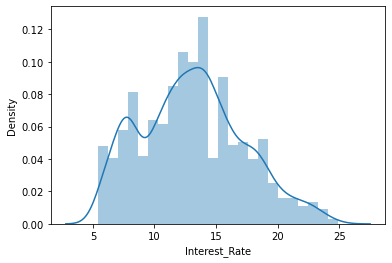

In [49]:
sns.distplot(df_cleaned.Interest_Rate)

In [50]:
print ("skewness:",df_cleaned.Interest_Rate.skew())
print ( "kurtosis:",df_cleaned.Interest_Rate.kurtosis())

skewness: 0.2797216746199095
kurtosis: -0.46030477146197457


In [51]:
#transformation

C:\Users\ADMIN\anaconda3\anaconda2\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='Interest_Rate', ylabel='Density'>

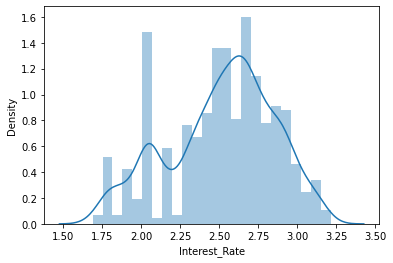

In [52]:
sns.distplot(np.log(df_cleaned.Interest_Rate))

In [53]:
print ("skweness:",np.log(df_cleaned.Interest_Rate).skew())
print ("kurtosis:",np.log(df_cleaned.Interest_Rate).kurtosis())

skweness: -0.3951060498317453
kurtosis: -0.5439036242758348


In [54]:
df_cleaned["ln_Interest_Rate"]=np.log(df_cleaned.Interest_Rate)

In [55]:
df_cleaned.head()

,Amount_Requested,Amount_Funded_By_Investors,Loan_Length,Debt_To_Income_Ratio,Monthly_Income,Open_CREDIT_Lines,Revolving_CREDIT_Balance,Inquiries_in_the_Last_6_Months,Employment_Length,FICO_Avg,...,State_WA,State_WI,State_WV,State_WY,Home_Ownership_NONE,Home_Ownership_OTHER,Home_Ownership_OWN,Home_Ownership_RENT,Interest_Rate,ln_Interest_Rate
0,20000.0,20000.0,36,14.90,6541.67,14.0,14272.0,2.0,1.0,737.0,...,0,0,0,0,0,0,0,0,8.90,2.186051
1,19200.0,19200.0,36,28.36,4583.33,12.0,11140.0,1.0,2.0,717.0,...,0,0,0,0,0,0,0,0,12.12,2.494857
2,35000.0,35000.0,60,23.81,11500.00,14.0,21977.0,1.0,2.0,692.0,...,0,0,0,0,0,0,0,0,21.98,3.090133
3,10000.0,9975.0,36,14.30,3833.33,10.0,9346.0,0.0,5.0,697.0,...,0,0,0,0,0,0,0,0,9.99,2.301585
4,12000.0,12000.0,36,18.78,3195.00,11.0,14469.0,0.0,9.0,697.0,...,0,0,0,0,0,0,0,1,11.71,2.460443


In [56]:
del df_cleaned["Interest_Rate"]

In [57]:
df_cleaned.head()

,Amount_Requested,Amount_Funded_By_Investors,Loan_Length,Debt_To_Income_Ratio,Monthly_Income,Open_CREDIT_Lines,Revolving_CREDIT_Balance,Inquiries_in_the_Last_6_Months,Employment_Length,FICO_Avg,...,State_VT,State_WA,State_WI,State_WV,State_WY,Home_Ownership_NONE,Home_Ownership_OTHER,Home_Ownership_OWN,Home_Ownership_RENT,ln_Interest_Rate
0,20000.0,20000.0,36,14.90,6541.67,14.0,14272.0,2.0,1.0,737.0,...,0,0,0,0,0,0,0,0,0,2.186051
1,19200.0,19200.0,36,28.36,4583.33,12.0,11140.0,1.0,2.0,717.0,...,0,0,0,0,0,0,0,0,0,2.494857
2,35000.0,35000.0,60,23.81,11500.00,14.0,21977.0,1.0,2.0,692.0,...,0,0,0,0,0,0,0,0,0,3.090133
3,10000.0,9975.0,36,14.30,3833.33,10.0,9346.0,0.0,5.0,697.0,...,0,0,0,0,0,0,0,0,0,2.301585
4,12000.0,12000.0,36,18.78,3195.00,11.0,14469.0,0.0,9.0,697.0,...,0,0,0,0,0,0,0,0,1,2.460443


### checking correlation with x & y variables

In [58]:
df_num.corrwith(df_cleaned.ln_Interest_Rate)

Amount_Requested                  0.303174
Amount_Funded_By_Investors        0.303420
Loan_Length                       0.386748
Debt_To_Income_Ratio              0.178855
Monthly_Income                    0.015095
Open_CREDIT_Lines                 0.068970
Revolving_CREDIT_Balance          0.080548
Inquiries_in_the_Last_6_Months    0.177758
Employment_Length                 0.035580
FICO_Avg                         -0.744596
dtype: float64

### checking correlation with x & y variables

In [59]:
corr_matrix=df_num.corr()

<AxesSubplot:>

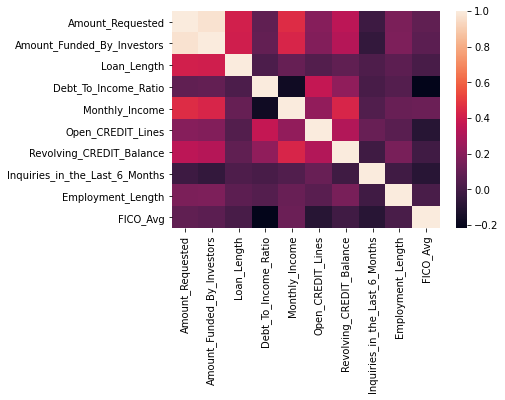

In [60]:
sns.heatmap(df_num.corr())

In [61]:
corr_matrix.to_excel('Correlation_Matrix.xlsx')

### Data Preparation Level III (Feature Reduction)

In [62]:
df_cleaned.shape

(2498, 73)

In [63]:
target = df_cleaned.ln_Interest_Rate

In [64]:
features = df_cleaned[df_cleaned.columns.difference(['ln_Interest_Rate'])]

In [65]:
features

,Amount_Funded_By_Investors,Amount_Requested,Debt_To_Income_Ratio,Employment_Length,FICO_Avg,Home_Ownership_NONE,Home_Ownership_OTHER,Home_Ownership_OWN,Home_Ownership_RENT,Inquiries_in_the_Last_6_Months,...,State_SC,State_SD,State_TX,State_UT,State_VA,State_VT,State_WA,State_WI,State_WV,State_WY
0,20000.00,20000.0,14.90,1.0,737.0,0,0,0,0,2.0,...,1,0,0,0,0,0,0,0,0,0
1,19200.00,19200.0,28.36,2.0,717.0,0,0,0,0,1.0,...,0,0,1,0,0,0,0,0,0,0
2,35000.00,35000.0,23.81,2.0,692.0,0,0,0,0,1.0,...,0,0,0,0,0,0,0,0,0,0
3,9975.00,10000.0,14.30,5.0,697.0,0,0,0,0,0.0,...,0,0,0,0,0,0,0,0,0,0
4,12000.00,12000.0,18.78,9.0,697.0,0,0,0,1,0.0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2495,29950.00,30000.0,19.23,8.0,707.0,0,0,0,0,1.0,...,0,0,0,0,0,0,0,0,0,0
2496,16000.00,16000.0,21.54,10.0,742.0,0,0,1,0,1.0,...,0,0,0,0,0,0,0,0,0,0
2497,10000.00,10000.0,4.89,10.0,682.0,0,0,0,0,0.0,...,0,0,0,0,0,0,0,0,0,0
2498,6000.00,6000.0,16.66,5.0,677.0,0,0,0,1,0.0,...,0,0,0,0,0,0,0,0,0,0


In [66]:
from sklearn.feature_selection import RFE
from sklearn.linear_model import LinearRegression

In [67]:
lm=LinearRegression()

In [68]:
rfe= RFE(lm, n_features_to_select=10)

In [69]:
rfe.fit(features,target)

RFE(estimator=LinearRegression(), n_features_to_select=10)

In [70]:
RFE_imp_vars= features.columns[rfe.get_support()]

In [71]:
list(RFE_imp_vars)

['Home_Ownership_NONE',
 'Home_Ownership_OTHER',
 'Loan_Purpose_credit_card',
 'Loan_Purpose_debt_consolidation',
 'Loan_Purpose_house',
 'Loan_Purpose_moving',
 'Loan_Purpose_other',
 'Loan_Purpose_small_business',
 'State_MT',
 'State_SD']

### F Regression (Univaraite Regression)

In [72]:
from sklearn.feature_selection import f_regression


In [73]:
F_values,P_values=f_regression(features,target)

In [74]:
F_values=pd.Series(F_values)

In [75]:
P_values=pd.Series(P_values)

In [76]:
cols=pd.Series(features.columns)

In [77]:
f_reg_res=pd.concat([cols,F_values,P_values],axis=1)

In [78]:
f_reg_res.columns = ['cols','F_values','p_values']

In [79]:
top_10_f_reg=f_reg_res.sort_values(by=["F_values"],ascending=False).head(10)

In [80]:
list(top_10_f_reg.cols)

['FICO_Avg',
 'Loan_Length',
 'Amount_Funded_By_Investors',
 'Amount_Requested',
 'Debt_To_Income_Ratio',
 'Inquiries_in_the_Last_6_Months',
 'Loan_Purpose_debt_consolidation',
 'Loan_Purpose_major_purchase',
 'Loan_Purpose_home_improvement',
 'Home_Ownership_RENT']

### K Best

In [81]:
from sklearn.feature_selection import SelectKBest, f_classif, chi2

In [82]:
selector=SelectKBest(f_classif,k=10).fit(features,target)

C:\Users\ADMIN\anaconda3\anaconda2\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:116: RuntimeWarning: divide by zero encountered in true_divide
  f = msb / msw


In [83]:
K_Best_10=features.columns[selector.get_support()]

In [84]:
list(K_Best_10)

['Amount_Funded_By_Investors',
 'FICO_Avg',
 'Home_Ownership_NONE',
 'Home_Ownership_OTHER',
 'Inquiries_in_the_Last_6_Months',
 'Loan_Length',
 'Loan_Purpose_educational',
 'State_IA',
 'State_IN',
 'State_MS']

### Corr between X and Y

In [85]:
col_names=pd.Series(list(df_cleaned.corrwith(df_cleaned.ln_Interest_Rate).index),name="Column_Names")

In [86]:
R_values=pd.Series(list(df_cleaned.corrwith(df_cleaned.ln_Interest_Rate)),name="R_Values")

In [87]:
corr=pd.concat([col_names,R_values],axis=1)

In [88]:
corr

,Column_Names,R_Values
0,Amount_Requested,0.303174
1,Amount_Funded_By_Investors,0.303420
2,Loan_Length,0.386748
3,Debt_To_Income_Ratio,0.178855
4,Monthly_Income,0.015095
...,...,...
68,Home_Ownership_NONE,-0.030098
69,Home_Ownership_OTHER,0.032261
70,Home_Ownership_OWN,-0.014625
71,Home_Ownership_RENT,0.086829


In [89]:
corr["abs_R_values"]=np.abs(corr.R_Values)

In [90]:
corr_12=corr.sort_values(by=["abs_R_values"],ascending=False).head(12)

In [91]:
list(corr_12["Column_Names"].iloc[1:])

['FICO_Avg',
 'Loan_Length',
 'Amount_Funded_By_Investors',
 'Amount_Requested',
 'Debt_To_Income_Ratio',
 'Inquiries_in_the_Last_6_Months',
 'Loan_Purpose_debt_consolidation',
 'Loan_Purpose_major_purchase',
 'Loan_Purpose_home_improvement',
 'Home_Ownership_RENT',
 'Revolving_CREDIT_Balance']

In [92]:
final_Vars={'Home_Ownership_NONE',
 'Home_Ownership_OTHER',
 'Loan_Purpose_credit_card',
 'Loan_Purpose_debt_consolidation',
 'Loan_Purpose_house',
 'Loan_Purpose_moving',
 'Loan_Purpose_other',
 'Loan_Purpose_small_business',
 'State_MT',
 'State_SD',
 'FICO_Avg',
 'Loan_Length',
 'Amount_Funded_By_Investors',
 'Amount_Requested',
 'Debt_To_Income_Ratio',
 'Inquiries_in_the_Last_6_Months',
 'Loan_Purpose_debt_consolidation',
 'Loan_Purpose_major_purchase',
 'Loan_Purpose_home_improvement',
 'Home_Ownership_RENT',
 'Amount_Funded_By_Investors',
 'FICO_Avg',
 'Home_Ownership_NONE',
 'Home_Ownership_OTHER',
 'Inquiries_in_the_Last_6_Months',
 'Loan_Length',
 'Loan_Purpose_educational',
 'State_IA',
 'State_IN',
 'State_MS',
  'FICO_Avg',
 'Loan_Length',
 'Amount_Funded_By_Investors',
 'Amount_Requested',
 'Debt_To_Income_Ratio',
 'Inquiries_in_the_Last_6_Months',
 'Loan_Purpose_debt_consolidation',
 'Loan_Purpose_major_purchase',
 'Loan_Purpose_home_improvement',
 'Home_Ownership_RENT',
 'Revolving_CREDIT_Balance'}

In [93]:
Final_Vars=list(final_Vars)

In [94]:
Final_Vars

['Loan_Purpose_home_improvement',
 'Loan_Purpose_other',
 'Home_Ownership_OTHER',
 'Home_Ownership_NONE',
 'Loan_Purpose_house',
 'Loan_Purpose_debt_consolidation',
 'Loan_Length',
 'Amount_Funded_By_Investors',
 'State_IN',
 'State_IA',
 'Debt_To_Income_Ratio',
 'Amount_Requested',
 'Loan_Purpose_credit_card',
 'Loan_Purpose_moving',
 'Loan_Purpose_educational',
 'State_MS',
 'Revolving_CREDIT_Balance',
 'Loan_Purpose_small_business',
 'FICO_Avg',
 'Home_Ownership_RENT',
 'State_MT',
 'Inquiries_in_the_Last_6_Months',
 'Loan_Purpose_major_purchase',
 'State_SD']

### VIF

In [95]:
features1=features[Final_Vars]

In [96]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
from patsy import dmatrices

In [97]:
VIF=[variance_inflation_factor(features1.values, i) for i in range (features1.shape[1])]

In [98]:
VIF=pd.Series(VIF,name="VIF")

In [99]:
cols=pd.Series(features1.columns,name="cols")

In [100]:
VIF_res=pd.concat([cols,VIF], axis=1)

In [101]:
VIF_10=VIF_res.sort_values(by=["VIF"],ascending=False).head(10)

In [102]:
VIF_10

,cols,VIF
11,Amount_Requested,64.663833
7,Amount_Funded_By_Investors,61.298503
18,FICO_Avg,34.845389
6,Loan_Length,21.544940
5,Loan_Purpose_debt_consolidation,9.984787
10,Debt_To_Income_Ratio,5.641625
12,Loan_Purpose_credit_card,4.024182
16,Revolving_CREDIT_Balance,2.519719
1,Loan_Purpose_other,2.352776
0,Loan_Purpose_home_improvement,2.131685


In [103]:
features1 = features1[features1.columns.difference(['Amount_Funded_By_Investors'])]

VIF = [variance_inflation_factor(features1.values,i) for i in range(features1.shape[1])]

VIF = pd.Series(VIF, name = 'VIF')

cols = pd.Series(features1.columns, name='Column_Name')

VIF_res = pd.concat([cols,VIF],axis=1)

VIF_10 = VIF_res.sort_values(by=['VIF'], ascending = False).head(10)

VIF_10

,Column_Name,VIF
2,FICO_Avg,34.833560
7,Loan_Length,21.507131
9,Loan_Purpose_debt_consolidation,9.981787
1,Debt_To_Income_Ratio,5.626500
0,Amount_Requested,5.139109
8,Loan_Purpose_credit_card,4.023947
17,Revolving_CREDIT_Balance,2.513652
15,Loan_Purpose_other,2.352659
11,Loan_Purpose_home_improvement,2.121605
5,Home_Ownership_RENT,2.012010


In [104]:
df_final=pd.concat([features1,df_cleaned.ln_Interest_Rate],axis=1)

In [105]:
df_final

,Amount_Requested,Debt_To_Income_Ratio,FICO_Avg,Home_Ownership_NONE,Home_Ownership_OTHER,Home_Ownership_RENT,Inquiries_in_the_Last_6_Months,Loan_Length,Loan_Purpose_credit_card,Loan_Purpose_debt_consolidation,...,Loan_Purpose_moving,Loan_Purpose_other,Loan_Purpose_small_business,Revolving_CREDIT_Balance,State_IA,State_IN,State_MS,State_MT,State_SD,ln_Interest_Rate
0,20000.0,14.90,737.0,0,0,0,2.0,36,0,1,...,0,0,0,14272.0,0,0,0,0,0,2.186051
1,19200.0,28.36,717.0,0,0,0,1.0,36,0,1,...,0,0,0,11140.0,0,0,0,0,0,2.494857
2,35000.0,23.81,692.0,0,0,0,1.0,60,0,1,...,0,0,0,21977.0,0,0,0,0,0,3.090133
3,10000.0,14.30,697.0,0,0,0,0.0,36,0,1,...,0,0,0,9346.0,0,0,0,0,0,2.301585
4,12000.0,18.78,697.0,0,0,1,0.0,36,1,0,...,0,0,0,14469.0,0,0,0,0,0,2.460443
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2495,30000.0,19.23,707.0,0,0,0,1.0,60,0,1,...,0,0,0,45880.0,0,0,0,0,0,2.819592
2496,16000.0,21.54,742.0,0,0,0,1.0,60,0,0,...,0,0,0,18898.0,0,0,0,0,0,2.645465
2497,10000.0,4.89,682.0,0,0,0,0.0,36,0,1,...,0,0,0,4544.0,0,0,0,0,0,2.638343
2498,6000.0,16.66,677.0,0,0,1,0.0,36,0,0,...,0,0,0,7753.0,0,0,0,0,0,2.519308


### Data Preparation Level 4 : Resampling Data --> train and test

In [106]:
from sklearn.model_selection import train_test_split

In [107]:
train,test = train_test_split(df_final, test_size = 0.3, random_state = 123)

In [108]:
y = 'ln_Interest_Rate'

In [109]:
y

'ln_Interest_Rate'

In [110]:
s = str()

In [111]:
for i in train.columns.tolist():
    s = s + '+' + i

In [112]:
equation=s[1:]

In [113]:
equation

'Amount_Requested+Debt_To_Income_Ratio+FICO_Avg+Home_Ownership_NONE+Home_Ownership_OTHER+Home_Ownership_RENT+Inquiries_in_the_Last_6_Months+Loan_Length+Loan_Purpose_credit_card+Loan_Purpose_debt_consolidation+Loan_Purpose_educational+Loan_Purpose_home_improvement+Loan_Purpose_house+Loan_Purpose_major_purchase+Loan_Purpose_moving+Loan_Purpose_other+Loan_Purpose_small_business+Revolving_CREDIT_Balance+State_IA+State_IN+State_MS+State_MT+State_SD+ln_Interest_Rate'

In [114]:
equation=equation.replace("+ln_Interest_Rate","")

In [115]:
equation

'Amount_Requested+Debt_To_Income_Ratio+FICO_Avg+Home_Ownership_NONE+Home_Ownership_OTHER+Home_Ownership_RENT+Inquiries_in_the_Last_6_Months+Loan_Length+Loan_Purpose_credit_card+Loan_Purpose_debt_consolidation+Loan_Purpose_educational+Loan_Purpose_home_improvement+Loan_Purpose_house+Loan_Purpose_major_purchase+Loan_Purpose_moving+Loan_Purpose_other+Loan_Purpose_small_business+Revolving_CREDIT_Balance+State_IA+State_IN+State_MS+State_MT+State_SD'

In [116]:
equation= y +"~" +equation

In [117]:
equation

'ln_Interest_Rate~Amount_Requested+Debt_To_Income_Ratio+FICO_Avg+Home_Ownership_NONE+Home_Ownership_OTHER+Home_Ownership_RENT+Inquiries_in_the_Last_6_Months+Loan_Length+Loan_Purpose_credit_card+Loan_Purpose_debt_consolidation+Loan_Purpose_educational+Loan_Purpose_home_improvement+Loan_Purpose_house+Loan_Purpose_major_purchase+Loan_Purpose_moving+Loan_Purpose_other+Loan_Purpose_small_business+Revolving_CREDIT_Balance+State_IA+State_IN+State_MS+State_MT+State_SD'

In [118]:
import statsmodels.formula.api as smf

In [119]:
model = smf.ols('ln_Interest_Rate~Amount_Requested+FICO_Avg+Home_Ownership_RENT+Inquiries_in_the_Last_6_Months+Loan_Length+Loan_Purpose_other', data=train).fit()

print(model.summary())

                            OLS Regression Results                            
Dep. Variable:       ln_Interest_Rate   R-squared:                       0.771
Model:                            OLS   Adj. R-squared:                  0.770
Method:                 Least Squares   F-statistic:                     977.3
Date:                Sun, 07 Nov 2021   Prob (F-statistic):               0.00
Time:                        13:05:37   Log-Likelihood:                 699.87
No. Observations:                1748   AIC:                            -1386.
Df Residuals:                    1741   BIC:                            -1347.
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
Intercept   

### Model Validation

In [120]:
train_pred=np.exp(model.predict(train))

In [121]:
test_pred=np.exp(model.predict(test))

In [122]:
train_Y=np.exp(train.ln_Interest_Rate)

In [123]:
test_Y=np.exp(test.ln_Interest_Rate)

#### Train Evaluation

In [124]:
from sklearn import metrics
import scipy.stats as stats

In [125]:
MAPE_train=round(np.mean(abs((train_Y-train_pred)/train_Y))*100,2)
print('MAPE_train',MAPE_train)

R2_train = round(metrics.r2_score(train_Y ,train_pred),4)
print('R2_train',R2_train)

Corr_train = stats.stats.pearsonr(train_Y , train_pred)
print('Corr_train',round(Corr_train[0],2))

RMSE_train = metrics.mean_squared_error(train_Y , train_pred)
print('RMSE_train',round(RMSE_train,2))

MAPE_train 12.26
R2_train 0.7833
Corr_train 0.89
RMSE_train 3.75


#### Test Evaluation

In [126]:
MAPE_test=round(np.mean(abs((test_Y-test_pred)/test_Y))*100,2)
print('MAPE_train',MAPE_test)

R2_test = round(metrics.r2_score(test_Y,test_pred),4)
print('R2_test',R2_test)

Corr_test = stats.stats.pearsonr(test_Y , test_pred)
print('Corr_test',round(Corr_test[0],2))

RMSE_test = metrics.mean_squared_error(test_Y , test_pred)
print('RMSE_test',round(RMSE_test,2))

MAPE_train 12.13
R2_test 0.7785
Corr_test 0.88
RMSE_test 3.94


### Decile Analysis

- train

In [127]:
train2=pd.concat([train_Y,train_pred],axis=1)

In [128]:
train2.columns= ['Y','Pred_Y']

In [129]:
train2

,Y,Pred_Y
1782,7.90,10.457579
1646,7.14,8.638359
797,21.48,20.638505
2269,20.49,21.053996
2234,17.14,18.499103
...,...,...
1147,17.99,17.163012
2154,13.11,12.656066
1766,7.49,8.312560
1122,9.99,8.449209


In [130]:
#Decile analysis - Train

train2['Deciles']=pd.qcut(train2['Pred_Y'],10,labels=False)

In [131]:
 train2.groupby(by=["Deciles"]).mean().sort_index(ascending=True)

,Y,Pred_Y
Deciles,,
0,7.451029,6.986509
1,8.681771,8.979160
2,9.677200,10.261406
3,11.239138,11.332363
4,12.647771,12.387959
5,13.666400,13.258296
6,14.803621,14.122102
7,15.705943,15.000031
8,16.765886,16.343751


In [132]:
test2=pd.concat([test_Y,test_pred],axis=1)

In [133]:
test2.columns= ['Y','Pred_Y']

In [134]:
test2

,Y,Pred_Y
1239,17.77,13.251417
2065,21.00,20.441724
2441,12.68,14.249039
2096,9.99,10.524498
289,10.36,8.578257
...,...,...
182,12.69,12.189542
1067,6.03,6.486404
978,14.33,13.632124
2236,17.93,18.869114


In [135]:
#Decile analysis - test

test2['Deciles']=pd.qcut(test2['Pred_Y'],10,labels=False)

In [136]:
 Decile_analysis_test=test2.groupby(by=["Deciles"]).mean().sort_index(ascending=True)

In [137]:
import matplotlib.pyplot as plt
import seaborn as sns

<AxesSubplot:xlabel='Deciles'>

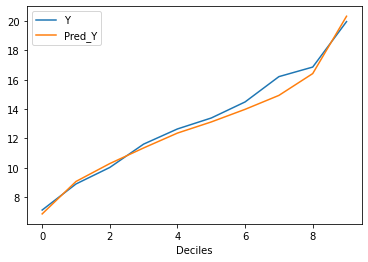

In [138]:
Decile_analysis_test.plot()

In [139]:
#Lets save everything in metrics_df to pickle object

import pickle

In [140]:
# Saving the model as a pickle object

with open('ROI_Predictor.pkl', 'wb') as f:
    pickle.dump(model, f)

In [141]:
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:       ln_Interest_Rate   R-squared:                       0.771
Model:                            OLS   Adj. R-squared:                  0.770
Method:                 Least Squares   F-statistic:                     977.3
Date:                Sun, 07 Nov 2021   Prob (F-statistic):               0.00
Time:                        13:05:40   Log-Likelihood:                 699.87
No. Observations:                1748   AIC:                            -1386.
Df Residuals:                    1741   BIC:                            -1347.
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
Intercept   

In [142]:
# importing the model

with open('ROI_Predictor.pkl', 'rb') as f:
    model = pickle.load(f)

In [143]:
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:       ln_Interest_Rate   R-squared:                       0.771
Model:                            OLS   Adj. R-squared:                  0.770
Method:                 Least Squares   F-statistic:                     977.3
Date:                Sun, 07 Nov 2021   Prob (F-statistic):               0.00
Time:                        13:05:40   Log-Likelihood:                 699.87
No. Observations:                1748   AIC:                            -1386.
Df Residuals:                    1741   BIC:                            -1347.
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
==================================================================================================
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
Intercept                          7.0811      0.083     85.125      0.000       6.918       7.244
Amount_Requested                1.126e-05   5.61e-07     20.080      0.000    1.02e-05    1.24e-05
FICO_Avg                          -0.0073      0.000    -64.020      0.000      -0.008      -0.007
Home_Ownership_RENT                0.0249      0.008      3.102      0.002       0.009       0.041
Inquiries_in_the_Last_6_Months     0.0348      0.003     10.003      0.000       0.028       0.042
Loan_Length                        0.0101      0.000     23.613      0.000       0.009       0.011
Loan_Purpose_other                 0.0597      0.014      4.139      0.000       0.031       0.088
==============================================================================
Omnibus:                       81.299   Durbin-Watson:                   2.008
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              246.577
Skew:                           0.139   Prob(JB):                     2.86e-54
Kurtosis:                       4.819   Cond. No.                     3.13e+05
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 3.13e+05. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [ ]:
df.Interest_Rate.min()